In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os
import base64

In [25]:
def get_frame_temepratures(frames):
  """
  Input esperado: Uma lsita dos frames, já no formato de imagem. Não precisa estar em grayscale
  Ouput: Uma lista com tuplas (temperatura mínima:float, temperatura máxima: float)
  """

  # As imagens de referência dos números brancos, em formato de string
  all_white_encoded = [
    "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/AG/tz/8AHJp+wn4W+AX7FP8AxNvjb8fvt3/CTftAf6jyv7D1S3ubf/iRX/8AaFo2bLWJ7L5Gixjzm3uVCegfET/gjp8Cf+DnT4E/Dr/grb4A1j/hnLxt8Q/7X/4WBafZ7rxf/bX2C6XRrH5pLuxhtvJh0pj+5gTf9pw+5ow7egf8HK37c/8Aw7X/AG7P2I/21v8AhV3/AAmn/CF/8LJ/4pn+2/7O+2fbNL0uw/4+PIn8vZ9q8z/Vtu2beN24e/8A/Brj/wAoKPgZ/wBzN/6k+rV8Af8ABqV/xso/YT+PX/BNH9tb/itPgl4L/wCEW/4RnwV/yDvsf2zVNX1W4/0yw8i7k33trBN88zbdmxcIzKfkD/g7R/aj+O3xX/4KxeLv2aPH/jn7f4J+E32D/hX+if2Zaxf2V/amhaPdX376OJZp/NmRX/fPJsxhNq5Ff//Z",
    "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/APPf+DS74d/8EnvDfx28I+P/AB/+0X/wkv7UfiX7f/wr/wCH/wDwiOu2f/CG/Z7XWI77/To2Onaj9r0wrP8AvgPI27EzKSa+QP8Ag6O/5Tr/ABz/AO5Z/wDUY0mj/g1x/wCU6/wM/wC5m/8AUY1aj/g6O/5Tr/HP/uWf/UY0mv1//wCDXH/glx+wn/wwn8DP+Cl3/CjP+L2/8VN/xWv/AAk2qf8AQU1bSv8Ajz+0/ZP+PL9z/qf9v7/zV9f/ALUf/BBX/gk9+2j8dtd/aX/aX/ZT/wCEl8beJfsv9t63/wAJ1rtn9p+z2sVrD+5tb6KFNsMESfKgztycsST/AP/Z",
    "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/APj74if8HOXx2+FHwJ+HX7NH/BJP4Lf8Mu+CfAv9r/a9E/4SO18bf2r9tulul/fazprTQeVM94/Dtv8AteDtWJBX6f8A7Q//AAwn/wAMJ/s6f8RbP/Jbf+Ku/sn/AJCn/QUj83/kTf8ARP8Ajy/sf734fP51fH/7Ln7LnwJ/4Ni/gToX/BRT/gop4G/4SX9qPxL9q/4U18Gv7TurP+xfs91Lpmr/APE30yW+06587TNVtrv/AEmIbNvlRZlLMv5A/tR/tR/Hb9tH47a7+0v+0v45/wCEl8beJfsv9t63/ZlrZ/afs9rFaw/ubWKKFNsMESfKgztycsST/Z7+3P8A8EuP2E/+ClH/AAi3/Da3wM/4TT/hC/t3/CM/8VNqmnfY/tn2f7R/x4XMHmb/ALLB9/dt2fLjc2e//Zc/Zc+BP7F3wJ0L9mj9mjwN/wAI14J8Nfav7E0T+07q8+zfaLqW6m/fXUssz7pp5X+ZzjdgYUAD/9k=",
    "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/APj74if8HOXx2+FHwJ+HX7NH/BJP4Lf8Mu+CfAv9r/a9E/4SO18bf2r9tulul/fazprTQeVM94/Dtv8AteDtWJBX6/f8E/P2XPgT/wAF+v8Agk98AP2l/wDgrZ4G/wCFs+NrD/hKvsmt/wBp3Wg+Xv125tW/c6NLaQnMOnWacof9TkfM7lv5wf2GP+Co/wC3Z/wTX/4Sn/hin45/8IX/AMJp9h/4Sb/imdL1H7Z9j+0fZ/8Aj/tp/L2fap/ubd2/5s7Vx/R9/wAE/P2XPgT/AMF+v+CT3wA/aX/4K2eBv+Fs+NrD/hKvsmt/2ndaD5e/Xbm1b9zo0tpCcw6dZpyh/wBTkfM7lj/gn5+y58Cf+C/X/BJ74AftL/8ABWzwN/wtnxtYf8JV9k1v+07rQfL367c2rfudGltITmHTrNOUP+pyPmdy3gH/AAcJftR/Hb/ggL8Cf2af2aP+CSfjn/hU3gm//wCEy+16J/Zlrr3mbLrTbpf32sxXcwxNqN4/Dj/XYPyogX//2Q==",
    "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/APj7/gjr/wAEdPgT4k+BN5/wVs/4K2ax/wAI1+y54a8v7JafZ7q8/wCEy+0XV7ozfNo12NR077JqYszzAfP3YGIg719f/wDB85/za7/3O3/uAr5//bn/AODlb9hP/gpR/wAIt/w2t/wRI/4TT/hC/t3/AAjP/GSeqad9j+2fZ/tH/Hhp0Hmb/ssH3923Z8uNzZ/QD/g61/aH/YT+An/Chf8Ahtb/AIJ1f8L+/tb/AISn/hGf+Lu6p4V/sLyv7I+0f8eEb/avP8yD7+PL+z/LnzGr8QP+CCv7LnwJ/bR/4KxfCn9mj9pfwN/wkvgnxL/bv9t6J/ad1Z/afs+hahdQ/vrWWKZNs0ET/K4ztwcqSD/V9+3P/wAEuP2E/wDgpR/wi3/Da3wM/wCE0/4Qv7d/wjP/ABU2qad9j+2fZ/tH/HhcweZv+ywff3bdny43Nn//2Q==",
    "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/APfv+DrX/gqP+3Z/wTX/AOFC/wDDFPxz/wCEL/4TT/hKf+Em/wCKZ0vUftn2P+yPs/8Ax/20/l7PtU/3Nu7f82dq4/ID/iKO/wCC6/8A0fN/5jLwx/8AKyj/AIijv+C6/wD0fN/5jLwx/wDKyv2+/wCCfn7LnwJ/4L9f8EnvgB+0v/wVs8Df8LZ8bWH/AAlX2TW/7TutB8vfrtzat+50aW0hOYdOs05Q/wCpyPmdyx/wT8/Zc+BP/Bfr/gk98AP2l/8AgrZ4G/4Wz42sP+Eq+ya3/ad1oPl79dubVv3OjS2kJzDp1mnKH/U5HzO5bwD/AIOEv2o/jt/wQF+BP7NP7NH/AAST8c/8Km8E3/8AwmX2vRP7Mtde8zZdabdL++1mK7mGJtRvH4cf67B+VEC//9k=",
    "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/AG/tz/8AHJp+wn4W+AX7FP8AxNvjb8fvt3/CTftAf6jyv7D1S3ubf/iRX/8AaFo2bLWJ7L5Gixjzm3uVCfiD+1H+1H8dv20fjtrv7S/7S/jn/hJfG3iX7L/bet/2Za2f2n7PaxWsP7m1iihTbDBEnyoM7cnLEk/0ff8AB1r/AMFR/wBuz/gmv/woX/hin45/8IX/AMJp/wAJT/wk3/FM6XqP2z7H/ZH2f/j/ALafy9n2qf7m3dv+bO1cd/8A8E/P2XPgT/wX6/4JPfAD9pf/AIK2eBv+Fs+NrD/hKvsmt/2ndaD5e/Xbm1b9zo0tpCcw6dZpyh/1OR8zuWP+Cfn7LnwJ/wCC/X/BJ74AftL/APBWzwN/wtnxtYf8JV9k1v8AtO60Hy9+u3Nq37nRpbSE5h06zTlD/qcj5nct4B/wcJftR/Hb/ggL8Cf2af2aP+CSfjn/AIVN4Jv/APhMvteif2Za695my6026X99rMV3MMTajePw4/12D8qIF//Z",
    "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/APn39uf/AIPFf27Pj3/wi3/DFPg//hQP9k/bv+Em/wCJhpfir+3fN+z/AGf/AI/9JT7L5Hlz/cz5n2j5seWtft//AMEFf2o/jt+2j/wSe+FP7S/7S/jn/hJfG3iX+3f7b1v+zLWz+0/Z9d1C1h/c2sUUKbYYIk+VBnbk5Ykn8Af+DY3/AII6fAn/AIKmfHbxp4//AGl9Y+3+CfhN/Zv9t/D/AOz3UX/CTf2pa6rHD/p1rdwTWX2ea0in+USebjYdq5J+f/8AgsX/AMFi/jt/wV/+O1n4/wDH+j/8I14J8NeZ/wAK/wDh/wDaLW8/4R77Ra2Ud9/p0dpbzXfnzWSz/vgfL3bEwoJb9P8A/gxj/wCbov8AuSf/AHP1+ANf/9k=",
    "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/AO+/4OEv2o/jt/wQF+BP7NP7NH/BJPxz/wAKm8E3/wDwmX2vRP7Mtde8zZdabdL++1mK7mGJtRvH4cf67B+VEC+//wDBPz9lz4E/8F+v+CT3wA/aX/4K2eBv+Fs+NrD/AISr7Jrf9p3Wg+Xv125tW/c6NLaQnMOnWacof9TkfM7lvAP+DhL9qP47f8EBfgT+zT+zR/wST8c/8Km8E3//AAmX2vRP7Mtde8zZdabdL++1mK7mGJtRvH4cf67B+VEC+/8A/BPz9lz4E/8ABfr/AIJPfAD9pf8A4K2eBv8AhbPjaw/4Sr7Jrf8Aad1oPl79dubVv3OjS2kJzDp1mnKH/U5HzO5Y/wCCfn7LnwJ/4L9f8EnvgB+0v/wVs8Df8LZ8bWH/AAlX2TW/7TutB8vfrtzat+50aW0hOYdOs05Q/wCpyPmdy3gH/Bwl+1H8dv8AggL8Cf2af2aP+CSfjn/hU3gm/wD+Ey+16J/Zlrr3mbLrTbpf32sxXcwxNqN4/Dj/AF2D8qIF/9k=",
    "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/AO+/4OEv2o/jt/wQF+BP7NP7NH/BJPxz/wAKm8E3/wDwmX2vRP7Mtde8zZdabdL++1mK7mGJtRvH4cf67B+VEC+//wDBPz9lz4E/8F+v+CT3wA/aX/4K2eBv+Fs+NrD/AISr7Jrf9p3Wg+Xv125tW/c6NLaQnMOnWacof9TkfM7lvwB/Zc/4L1f8FYf2LvgToX7NH7NH7Vn/AAjXgnw19q/sTRP+EF0K8+zfaLqW6m/fXVjLM+6aeV/mc43YGFAA/p+/4IK/tR/Hb9tH/gk98Kf2l/2l/HP/AAkvjbxL/bv9t63/AGZa2f2n7PruoWsP7m1iihTbDBEnyoM7cnLEk/AH/BBX/ggr/wAEnv20f+CT3wp/aX/aX/ZT/wCEl8beJf7d/tvW/wDhOtds/tP2fXdQtYf3NrfRQpthgiT5UGduTliSfgD/AIO0f2o/jt8V/wDgrF4u/Zo8f+Oft/gn4TfYP+Ff6J/ZlrF/ZX9qaFo91ffvo4lmn82ZFf8AfPJsxhNq5Ff/2Q==",
  ]

  # As imagens de referência dos números pretos, em formato de string
  all_black_encoded = [
      "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/AG/sMf8AHWX+3Z4p+Pv7a3/Ep+CXwB+w/wDCM/s//wCv83+3NLuLa4/4nth/Z92uL3R4L351lznyV2IGL+f/AA7/AOCxfx2/4Ni/jt8Rf+CSXj/R/wDho3wT8PP7I/4V/d/aLXwh/Yv2+1bWb75Y7S+mufOm1VR++nfZ9mym1ZCi+f8A/BtT+wx/w8o/YT/bc/Yp/wCFo/8ACF/8Jp/wrb/ipv7E/tH7H9j1TVL/AP49/Pg8zf8AZfL/ANYu3fu527T4B/wdHf8AKdf45/8Acs/+oxpNff8A/wAHWv8AxrX/AG7PgL/wUu/Yp/4ov42+NP8AhKf+Em8a/wDIR+2fY9L0jSrf/Q7/AM+0j2WV1PD8kK7t+9suqsPr/wD4NLv2XPgT8KP+CT3hH9pfwB4G+weNviz9v/4WBrf9p3Uv9q/2XrusWtj+5klaGDyoXZP3KR785fc2DX//2Q==",
      "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/AO+/4O0fiJ/wVh8SfAnxd4A8Afs6f8I1+y54a+wf8LA+IH/CXaFef8Jl9outHksf9BkUajp32TUw0H7knz9298RACvr/AP4Ncf8AlBR8DP8AuZv/AFJ9Wo/4Ojv+UFHxz/7ln/1J9Jo/4Ncf+UFHwM/7mb/1J9Wr8gP+Do7/AIKj/t2f8N2fHP8A4Jo/8Lz/AOLJf8Uz/wAUV/wjOl/9AvSdV/4/Ps32v/j9/ff67/Y+58tfIH7Ln/Ber/grD+xd8CdC/Zo/Zo/as/4RrwT4a+1f2Jon/CC6FefZvtF1LdTfvrqxlmfdNPK/zOcbsDCgAf/Z",
      "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/APr34d/8GxvwJ+K/x2+Iv7S//BWz40/8NReNvHX9kfZNb/4Ry68E/wBlfYrVrVv3OjaksM/mwpZpyi7PsmRuaVzX5gfs8f8ADdn/AA3Z+0X/AMQk3/JEv+KR/tb/AJBf/QLk8r/kcv8AS/8Aj9/tj7v4/J5NfYH7Uf7Ufx2/4OdPjtrv/BOv/gnX45/4Rr9lzw19l/4XL8Zf7Mtbz+2vtFrFqekf8SjU4rHUbbydT0q5tP8ARpTv3ebLiIKrfr9+y5+y58Cf2LvgToX7NH7NHgb/AIRrwT4a+1f2Jon9p3V59m+0XUt1N++upZZn3TTyv8znG7AwoAH8YX7DH/BUf9uz/gmv/wAJT/wxT8c/+EL/AOE0+w/8JN/xTOl6j9s+x/aPs/8Ax/20/l7PtU/3Nu7f82dq44D9qP8Aaj+O37aPx2139pf9pfxz/wAJL428S/Zf7b1v+zLWz+0/Z7WK1h/c2sUUKbYYIk+VBnbk5Ykn/9k=",
      "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/APr34d/8GxvwJ+K/x2+Iv7S//BWz40/8NReNvHX9kfZNb/4Ry68E/wBlfYrVrVv3OjaksM/mwpZpyi7PsmRuaVzX5A/8FA/2o/jt/wAEBf8AgrF8f/2aP+CSfjn/AIVN4Jv/APhFfteif2Za695mzQra6X99rMV3MMTajePw4/12D8qIF/o+/bn/AOCXH7Cf/BSj/hFv+G1vgZ/wmn/CF/bv+EZ/4qbVNO+x/bPs/wBo/wCPC5g8zf8AZYPv7tuz5cbmz/OD/wAFA/2o/jt/wQF/4KxfH/8AZo/4JJ+Of+FTeCb/AP4RX7Xon9mWuveZs0K2ul/fazFdzDE2o3j8OP8AXYPyogU/4KB/tR/Hb/ggL/wVi+P/AOzR/wAEk/HP/CpvBN//AMIr9r0T+zLXXvM2aFbXS/vtZiu5hibUbx+HH+uwflRAvv8A/wAG9v7LnwJ/4L9fHb9pb9pf/grZ4G/4Wz42sP8AhDfsmt/2ndaD5e+11K1b9zo0tpCcw6dZpyh/1OR8zuW//9k=",
      "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/APr3/gsX/wAFi/jt4b+O1n/wST/4JJ6P/wAJL+1H4l8z7Xd/aLWz/wCEN+z2tlrK/LrNodO1H7XphvBxOPI25OZSiV8gf8GMf/N0X/ck/wDufr6A/YY/4Nqf27P+Ca//AAlP/DFP/Bbf/hC/+E0+w/8ACTf8Y2aXqP2z7H9o+z/8f+oz+Xs+1T/c27t/zZ2rj8//APg1K/Z4/bs+Pf8Awvr/AIYp/wCCiv8AwoH+yf8AhFv+Em/4tFpfir+3fN/tf7P/AMf8ifZfI8uf7mfM+0fNjy1r9v8A/gvV+1H8dv2Lv+CT3xW/aX/Zo8c/8I1428Nf2F/Ymt/2Za3n2b7Rrun2s37m6ilhfdDPKnzIcbsjDAEfyg/sMf8ABUf9uz/gmv8A8JT/AMMU/HP/AIQv/hNPsP8Awk3/ABTOl6j9s+x/aPs//H/bT+Xs+1T/AHNu7f8ANnauP//Z",
      "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/APn3/g1K/wCCXH7Cf/BSj/hfX/Da3wM/4TT/AIQv/hFv+EZ/4qbVNO+x/bP7X+0f8eFzB5m/7LB9/dt2fLjc2f1//wCIXH/ghR/0Yz/5k3xP/wDLOj/iFx/4IUf9GM/+ZN8T/wDyzr8Qf+Cgf7Ufx2/4IC/8FYvj/wDs0f8ABJPxz/wqbwTf/wDCK/a9E/sy117zNmhW10v77WYruYYm1G8fhx/rsH5UQKf8FA/2o/jt/wAEBf8AgrF8f/2aP+CSfjn/AIVN4Jv/APhFfteif2Za695mzQra6X99rMV3MMTajePw4/12D8qIF9//AODe39lz4E/8F+vjt+0t+0v/AMFbPA3/AAtnxtYf8Ib9k1v+07rQfL32upWrfudGltITmHTrNOUP+pyPmdy3/9k=",
      "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/AG/sMf8AHWX+3Z4p+Pv7a3/Ep+CXwB+w/wDCM/s//wCv83+3NLuLa4/4nth/Z92uL3R4L351lznyV2IGL/t9+y5+y58Cf2LvgToX7NH7NHgb/hGvBPhr7V/Ymif2ndXn2b7RdS3U3766llmfdNPK/wAznG7AwoAH84P/AAalf8EuP2E/+ClH/C+v+G1vgZ/wmn/CF/8ACLf8Iz/xU2qad9j+2f2v9o/48LmDzN/2WD7+7bs+XG5s8B/wUD/aj+O3/BAX/grF8f8A9mj/AIJJ+Of+FTeCb/8A4RX7Xon9mWuveZs0K2ul/fazFdzDE2o3j8OP9dg/KiBT/goH+1H8dv8AggL/AMFYvj/+zR/wST8c/wDCpvBN/wD8Ir9r0T+zLXXvM2aFbXS/vtZiu5hibUbx+HH+uwflRAvv/wDwb2/sufAn/gv18dv2lv2l/wDgrZ4G/wCFs+NrD/hDfsmt/wBp3Wg+XvtdStW/c6NLaQnMOnWacof9TkfM7lv/2Q==",
      "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/APfv2GP+DOr9hP4Cf8JT/wANreMP+F/f2t9h/wCEZ/4l+qeFf7C8r7R9o/48NWf7V5/mQffx5f2f5c+Y1fiB/wAF6v2XPgT+xd/wVi+K37NH7NHgb/hGvBPhr+wv7E0T+07q8+zfaNC0+6m/fXUssz7pp5X+ZzjdgYUAD9/v+DnL/gsX8dv+CWfwJ8F+AP2aNH+weNviz/aX9ifED7Ray/8ACM/2XdaVJN/oN1aTw3v2iG7lg+Yx+VneNzYA+gP+COv/AAR0+BP/AASA+BN54A8Aax/wkvjbxL5f/CwPiB9nurP/AISH7PdXslj/AKDJd3ENp5EN60H7kjzNu98sQF/MD/g+c/5td/7nb/3AV+/1f//Z",
      "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/APPf+De39lz4E/8ABfr47ftLftL/APBWzwN/wtnxtYf8Ib9k1v8AtO60Hy99rqVq37nRpbSE5h06zTlD/qcj5nct4B/wUD/aj+O3/BAX/grF8f8A9mj/AIJJ+Of+FTeCb/8A4RX7Xon9mWuveZs0K2ul/fazFdzDE2o3j8OP9dg/KiBff/8Ag3t/Zc+BP/Bfr47ftLftL/8ABWzwN/wtnxtYf8Ib9k1v+07rQfL32upWrfudGltITmHTrNOUP+pyPmdy3gH/AAUD/aj+O3/BAX/grF8f/wBmj/gkn45/4VN4Jv8A/hFfteif2Za695mzQra6X99rMV3MMTajePw4/wBdg/KiBT/goH+1H8dv+CAv/BWL4/8A7NH/AAST8c/8Km8E3/8Awiv2vRP7Mtde8zZoVtdL++1mK7mGJtRvH4cf67B+VEC+/wD/AAb2/sufAn/gv18dv2lv2l/+Ctngb/hbPjaw/wCEN+ya3/ad1oPl77XUrVv3OjS2kJzDp1mnKH/U5HzO5b//2Q==",
      "/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/wAALCAAUAA4BAREA/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/9oACAEBAAA/APPf+De39lz4E/8ABfr47ftLftL/APBWzwN/wtnxtYf8Ib9k1v8AtO60Hy99rqVq37nRpbSE5h06zTlD/qcj5nct4B/wUD/aj+O3/BAX/grF8f8A9mj/AIJJ+Of+FTeCb/8A4RX7Xon9mWuveZs0K2ul/fazFdzDE2o3j8OP9dg/KiBf3+/aj/4IK/8ABJ79tH47a7+0v+0v+yn/AMJL428S/Zf7b1v/AITrXbP7T9ntYrWH9za30UKbYYIk+VBnbk5Ykn+YH/gvV+y58Cf2Lv8AgrF8Vv2aP2aPA3/CNeCfDX9hf2Jon9p3V59m+0aFp91N++upZZn3TTyv8znG7AwoAH3/AP8ABer/AIL1f8FYf2Lv+CsXxW/Zo/Zo/as/4RrwT4a/sL+xNE/4QXQrz7N9o0LT7qb99dWMsz7pp5X+ZzjdgYUAD7//AODS79lz4E/Cj/gk94R/aX8AeBvsHjb4s/b/APhYGt/2ndS/2r/Zeu6xa2P7mSVoYPKhdk/cpHvzl9zYNf/Z",
  ]

  # Transformando as listas de strings no formato de imagem novamente
  all_white = [cv.imdecode(np.frombuffer(base64.b64decode(x), np.uint8), cv.IMREAD_GRAYSCALE) for x in all_white_encoded]
  all_black = [cv.imdecode(np.frombuffer(base64.b64decode(x), np.uint8), cv.IMREAD_GRAYSCALE) for x in all_black_encoded]



  # Função que determina a cor do número da imagem
  def find_out_if_black_or_white(image_num):
    if image_num[19, 6] < 128:
      return 'black'
    else:
      return 'white'

  # Função que limpa o ruído de imagens com número branco
  def clean_white(image, threshold):
    # threshold recomendado: 190
    return np.where(image > threshold, 255, 0)

  # Função que limpa o ruído de imagens com número preto
  def clean_black(image, threshold):
    # threshold recomendado: 65
    return np.where(image < threshold, 0, 255)

  # Limpando os ruídos da conversão de string para imagem
  all_white = [clean_white(x, 190) for x in all_white]
  all_black = [clean_black(x, 65) for x in all_black]

  # Função que classifica um digito específico
  def classify_digit(digit_image):
    color = find_out_if_black_or_white(digit_image)

    if color == 'white':
      white_thresholds = [130, 150, 170, 190, 210, 230, 245]
      for threshold in white_thresholds:
        clean_digit_image = clean_white(digit_image, threshold)
        for i in range(len(all_white)):
          if np.array_equal(clean_digit_image, all_white[i]):
            return str(i)
      for i in range(len(all_white)):
        if abs(clean_white(digit_image, 190) - all_white[i]).sum() < 255*5:
          return str(i)

    elif color == 'black':
      black_thresholds = [125, 105, 85, 65, 45, 25, 15, 10]
      for threshold in black_thresholds:
        clean_digit_image = clean_black(digit_image, threshold)
        for i in range(len(all_black)):
          if np.array_equal(clean_digit_image, all_black[i]):
            return str(i)

    return '0'

  # Função que retorna as temperaturas mínimas e máximas do frame
  def receive_frame_and_extract_temperatures(frame):
    frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

    max_tens = frame[68:88, 512:526]
    max_unit = frame[68:88, 528:542]
    max_decimal = frame[68:88, 560:574]

    min_tens = frame[404:424, 512:526]
    min_unit = frame[404:424, 528:542]
    min_decimal = frame[404:424, 560:574]

    max_number = classify_digit(max_tens) + classify_digit(max_unit) + '.' + classify_digit(max_decimal)
    min_number = classify_digit(min_tens) + classify_digit(min_unit) + '.' + classify_digit(min_decimal)

    return (float(min_number), float(max_number))

  # Corpo principal da função
  temperature_list = []
  for frame in frames:
    temperature_list.append(receive_frame_and_extract_temperatures(frame))
  return temperature_list

In [12]:
test_frames = []
for frame in os.listdir('/content/drive/MyDrive/exercicios_inteli/Min Max Cattle Frame Temperature/mariana'):
  test_frames.append(cv.imread(f'/content/drive/MyDrive/exercicios_inteli/Min Max Cattle Frame Temperature/mariana/{frame}'))

In [26]:
get_frame_temepratures(test_frames)

[(17.7, 38.2),
 (16.5, 37.2),
 (17.2, 37.2),
 (15.5, 37.8),
 (11.3, 38.2),
 (16.8, 37.4),
 (15.8, 36.8),
 (15.8, 37.6),
 (16.7, 38.2),
 (13.8, 39.5),
 (16.5, 37.8),
 (16.3, 37.8),
 (13.5, 37.6),
 (15.1, 37.0),
 (17.2, 38.6),
 (16.7, 38.2),
 (14.3, 37.4),
 (17.0, 39.1),
 (16.5, 38.9),
 (12.3, 39.3),
 (11.8, 38.2),
 (18.9, 37.6),
 (13.8, 39.5),
 (13.5, 37.8),
 (15.5, 37.0),
 (13.6, 7.4),
 (17.4, 37.4),
 (15.8, 37.6),
 (11.3, 39.1),
 (12.1, 38.7),
 (11.5, 38.2),
 (16.3, 37.6),
 (12.8, 38.0),
 (15.0, 37.6),
 (16.5, 37.6),
 (16.7, 38.5),
 (15.5, 37.8),
 (15.5, 37.4),
 (16.3, 36.8),
 (15.8, 38.9),
 (11.8, 38.7),
 (16.0, 36.6),
 (17.0, 38.5),
 (15.6, 37.8),
 (17.5, 38.2),
 (11.8, 38.4),
 (16.5, 39.9),
 (17.7, 36.6),
 (16.2, 37.6),
 (18.2, 38.7),
 (12.3, 37.4),
 (16.0, 38.5),
 (11.5, 36.8),
 (16.7, 39.3),
 (12.3, 38.7),
 (12.3, 36.8),
 (16.8, 37.6),
 (12.6, 38.2),
 (12.5, 37.8),
 (13.3, 38.2),
 (12.0, 37.4),
 (17.5, 38.4),
 (15.6, 37.4),
 (16.0, 37.4),
 (13.1, 36.8),
 (17.2, 37.0),
 (17.5, 36.

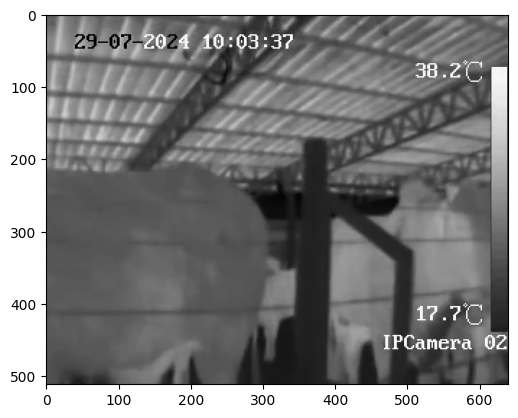

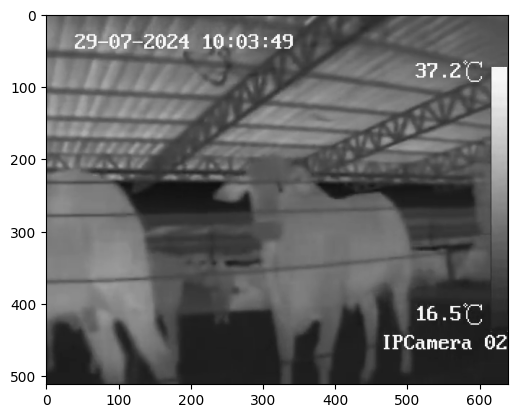

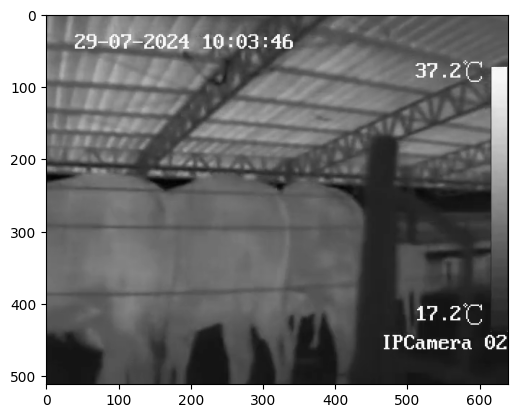

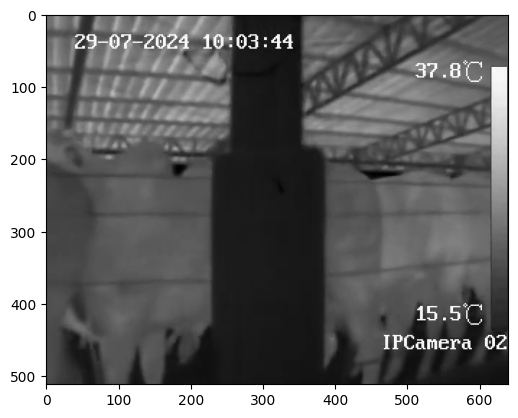

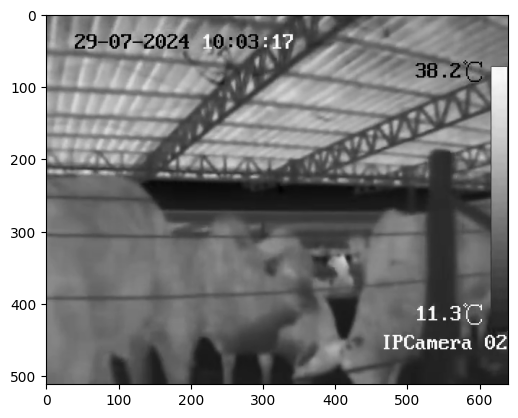

...

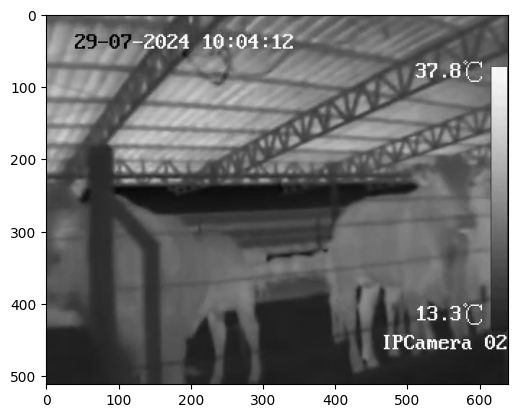

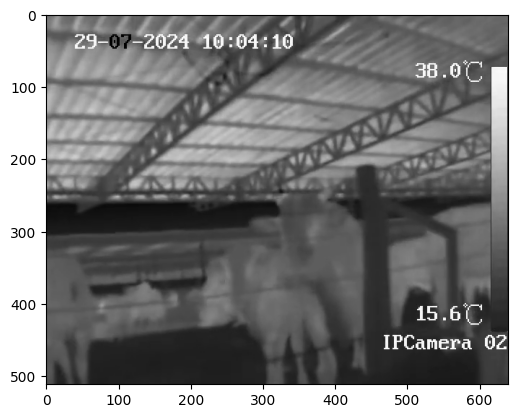

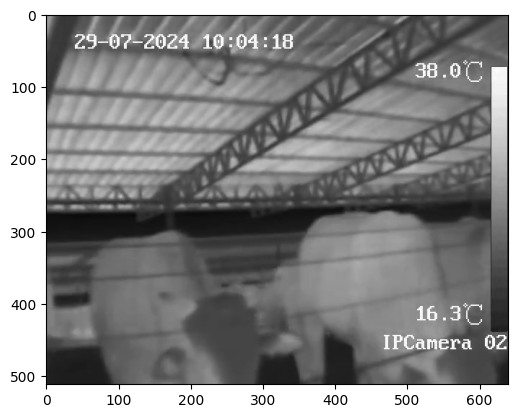

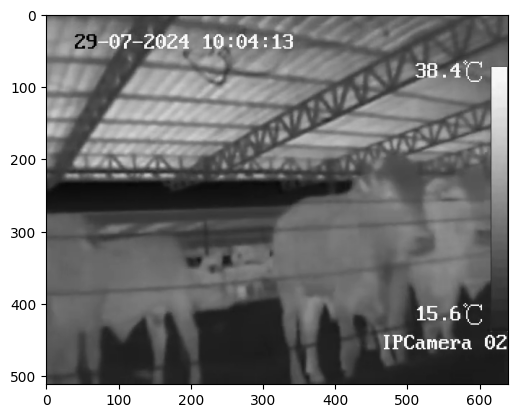

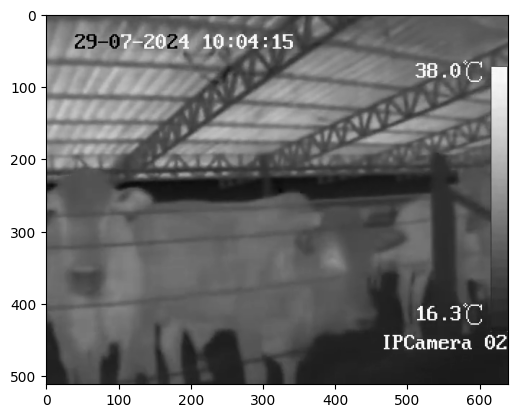

In [14]:
for frame in test_frames:
  plt.imshow(frame)
  plt.show()

In [22]:
cv.cvtColor(test_frames[25], cv.COLOR_BGR2GRAY)[68:88, 512:526]

array([[150, 146,   5,   5,   5,   8,   6,   6,   5,   3,   1,   5, 131,
        129],
       [151, 138,   3,   0,   2,   4,   4,   4,   3,   2,   0,   8, 126,
        130],
       [  3,   1,   2,   2, 135, 139, 144, 142, 152, 144,   0,   2,   3,
          0],
       [  8,   2,   2,   2, 137, 140, 143, 145, 149, 144,   0,   0,   0,
          0],
       [152, 151, 145, 142, 138, 133, 126, 124, 123, 117,   0,   0,   0,
          0],
       [144, 140, 135, 126, 122, 117, 114, 102, 105, 105,   0,   0,   0,
          0],
       [133, 123, 117, 114, 111, 108, 104,  95, 104,  88,   3,   0,   0,
          0],
       [124, 114, 116, 109,  89,  78,  68,  67,  91,  78,   5,   0,   0,
          0],
       [104,  88, 104,  64,  11,   5,   8,  22,  10,   4,   5,   2,  44,
         59],
       [108,  90,  93,  61,  31,  12,   0,   1,   3,   4,   6,   5,  39,
         50],
       [100,  81,  76,  65,  64,  52,  38,  36,  55,  64,   9,  11,  10,
          9],
       [ 83,  67,  65,  62,  65,  64,  67,  71,  69,  65,   0,   0,   0,
          5],
       [ 74,  69,  67,  64,  66,  67,  68,  67,  67,  66,   0,   0,   0,
          1],
       [ 69,  68,  68,  65,  66,  66,  68,  69,  68,  69,   0,   0,   0,
          0],
       [ 66,  66,  67,  66,  67,  67,  68,  68,  67,  68,   0,   5,   0,
          1],
       [ 67,  66,  66,  66,  67,  69,  71,  72,  52,  62,   1,  13,   4,
          0],
       [  2,   1,   5,   2,  67,  67,  69,  72,  73,  72,   1,   1,   8,
          1],
       [  9,  11,   4,   6,  68,  68,  67,  68,  69,  58,   0,   0,  10,
         25],
       [ 88,  80,  13,   3,   5,   3,   1,   1,   2,   5,  10,   0,  82,
         86],
       [ 98,  90,  16,   6,   2,   0,   0,   0,   1,  12,  16,   9,  71,
         65]], dtype=uint8)